In [1]:
#import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [2]:
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout


In [3]:
#from keras.callbacks import EarlyS
from keras.callbacks import EarlyStopping

In [4]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [5]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'
    
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)
    
    ela_image = ImageChops.difference(image, temp_image)
    
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image

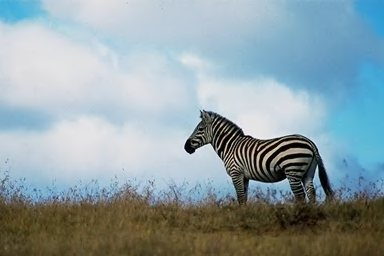

In [6]:
real_image_path ='C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Au\\Au_ani_00001.jpg'
Image.open(real_image_path)


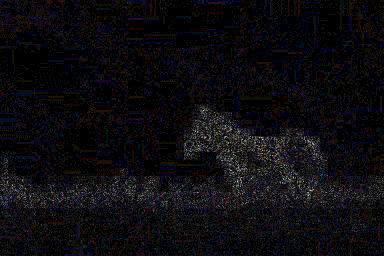

In [7]:
convert_to_ela_image(real_image_path, 90)

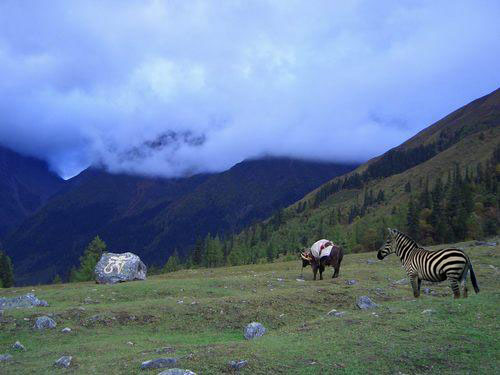

In [8]:
fake_image_path = 'C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Tp\\Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
Image.open(fake_image_path)

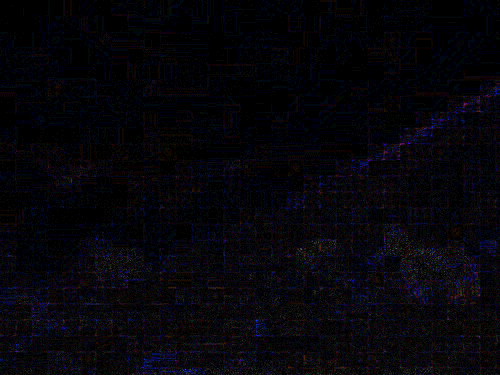

In [9]:
convert_to_ela_image(fake_image_path, 90)

In [10]:
import sklearn
print('The scikit-learn version is {}.'.format(sklearn.__version__))

The scikit-learn version is 1.4.2.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


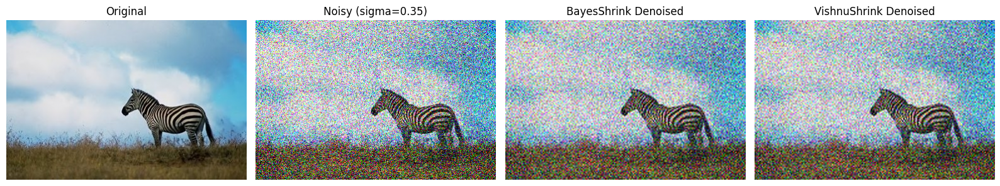

In [11]:
import numpy as np
import skimage
from skimage import io, img_as_float
from skimage.restoration import estimate_sigma, denoise_wavelet

# Load the image
img_r = io.imread('C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Au\\Au_ani_00001.jpg')

# Convert image to floating point representation
img_float_r = img_as_float(img_r)

# Add noise to the image
sigma = 0.35  # Adjust this parameter as needed
img_noisy = skimage.util.random_noise(img_float_r, var=sigma**2)

# Estimate the noise standard deviation for each channel
sigma_est = [estimate_sigma(img_noisy[:, :, i]) for i in range(img_noisy.shape[2])]

# Use the mean of the estimated standard deviations across channels
mean_sigma_est = np.mean(sigma_est)

# Denoise using wavelet denoising with BayesShrink
img_denoised_bayes = denoise_wavelet(img_noisy, wavelet='coif5', method='BayesShrink', mode='soft',
                                     rescale_sigma=True, sigma=mean_sigma_est, convert2ycbcr=True,
                                     channel_axis=-1)  # Specify channel_axis as -1 for RGB images

# Denoise using wavelet denoising with VisuShrink
img_denoised_vishnu = denoise_wavelet(img_noisy, wavelet='coif5', method='VisuShrink', mode='soft',
                                       rescale_sigma=True, sigma=mean_sigma_est, convert2ycbcr=True,
                                       channel_axis=-1)  # Specify channel_axis as -1 for RGB images

# Display the original, noisy, and denoised images
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 4, figsize=(16, 4))  # Create a layout for four images

axes[0].imshow(img_float_r)
axes[0].set_title('Original')

axes[1].imshow(img_noisy)
axes[1].set_title('Noisy (sigma={:.2f})'.format(sigma))

axes[2].imshow(img_denoised_bayes)
axes[2].set_title('BayesShrink Denoised')

axes[3].imshow(img_denoised_vishnu)
axes[3].set_title('VishnuShrink Denoised')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()




In [12]:
import cv2
psnr_noisy = cv2.PSNR(img_noisy,img_noisy)
psnr_noisy

361.20199909921956

In [13]:

psnr_bayes = cv2.PSNR(img_noisy ,img_denoised_bayes )
psnr_bayes




60.78914925421679

In [14]:
psnr_visu = cv2.PSNR(img_noisy,img_denoised_vishnu )
psnr_bayes

60.78914925421679

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


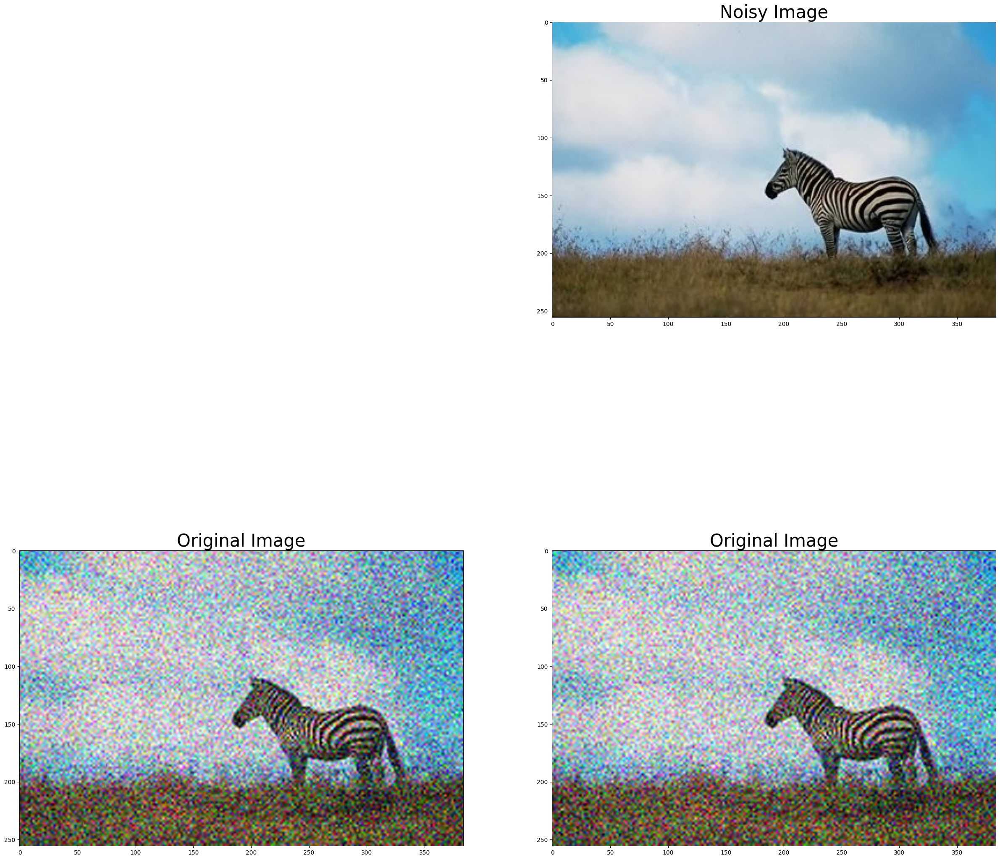

In [15]:
# Plotting images
plt.figure(figsize=(30,30))

# plt.subplot(2,2,1)
# plt.imshow(img,cmap=plt.cm.gray)
# plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_r,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_denoised_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_denoised_vishnu,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [16]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)


PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 60.78118779124761
PSNR[Original vs. Denoised(Bayes)] 60.78914925421679


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


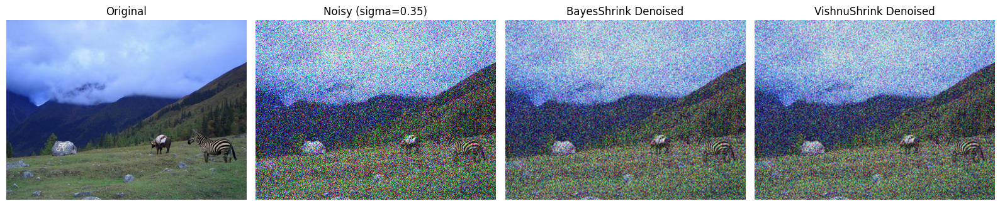

In [17]:
import numpy as np
import skimage
from skimage import io, img_as_float
from skimage.restoration import estimate_sigma, denoise_wavelet

# Load the image
img_f= io.imread('C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Tp\\Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')

# Convert image to floating point representation
img_float_f = img_as_float(img_f)

# Add noise to the image
sigma = 0.35  # Adjust this parameter as needed
img_noisy = skimage.util.random_noise(img_float_f, var=sigma**2)

# Estimate the noise standard deviation for each channel
sigma_est = [estimate_sigma(img_noisy[:, :, i]) for i in range(img_noisy.shape[2])]

# Use the mean of the estimated standard deviations across channels
mean_sigma_est = np.mean(sigma_est)

# Denoise using wavelet denoising with BayesShrink
img_denoised_bayes = denoise_wavelet(img_noisy, wavelet='coif5', method='BayesShrink', mode='soft',
                                     rescale_sigma=True, sigma=mean_sigma_est, convert2ycbcr=True,
                                     channel_axis=-1)  # Specify channel_axis as -1 for RGB images

# Denoise using wavelet denoising with VisuShrink
img_denoised_vishnu = denoise_wavelet(img_noisy, wavelet='coif5', method='VisuShrink', mode='soft',
                                       rescale_sigma=True, sigma=mean_sigma_est, convert2ycbcr=True,
                                       channel_axis=-1)  # Specify channel_axis as -1 for RGB images

# Display the original, noisy, and denoised images
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 4, figsize=(16, 4))  # Create a layout for four images

axes[0].imshow(img_float_f)
axes[0].set_title('Original')

axes[1].imshow(img_noisy)
axes[1].set_title('Noisy (sigma={:.2f})'.format(sigma))

axes[2].imshow(img_denoised_bayes)
axes[2].set_title('BayesShrink Denoised')

axes[3].imshow(img_denoised_vishnu)
axes[3].set_title('VishnuShrink Denoised')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()




In [18]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [19]:
psnr_bayes = cv2.PSNR(img_noisy ,img_denoised_bayes)
psnr_bayes

60.65012506771768

In [20]:
psnr_visu = cv2.PSNR(img_noisy,img_denoised_vishnu)
psnr_bayes

60.65012506771768

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


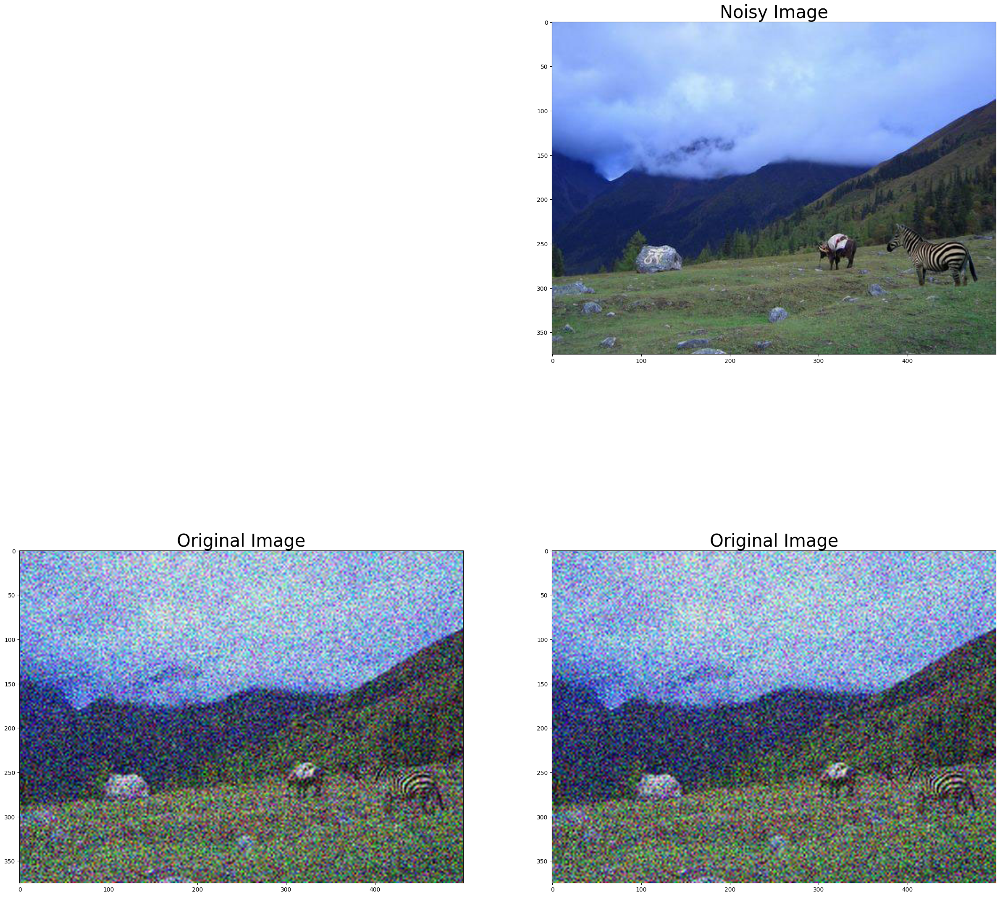

In [21]:
# Plotting images
plt.figure(figsize=(30,30))

# plt.subplot(2,2,1)
# plt.imshow(img,cmap=plt.cm.gray)
# plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_denoised_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_denoised_vishnu,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [22]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 60.63379844970835
PSNR[Original vs. Denoised(Bayes)] 60.65012506771768


In [23]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

In [24]:
def denoise_img(img):
    #img=skimage.io.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
    img=skimage.img_as_float(img_f) #converting image as float


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    # Denoising using Bayes
    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


    #Denoising using Visushrink
    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes 

In [25]:
image_size = (128, 128)

In [26]:
def prepare_image(image_path):
    return np.array(convert_to_ela_image(image_path, 90).resize(image_size)).flatten() / 255.0

In [27]:
X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

In [28]:
import random
path = 'C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Au'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images
Processing 1000 images
Processing 1500 images
Processing 2000 images
Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
Processing 4500 images
Processing 5000 images
Processing 5500 images
Processing 6000 images
Processing 6500 images
Processing 7000 images
2100 2100


In [29]:
path = 'C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Tp'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
4164 4164


In [30]:
import numpy as np
X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [31]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=5)
X = X.reshape(-1,1,1,1)
print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))

3331 3331
833 833


In [32]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout



def build_model():
    model = Sequential()
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(MaxPool2D(pool_size = (2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation = 'relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation = 'softmax'))
    return model

In [33]:
model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 124, 124, 32)      2432      
                                                                 
 conv2d_1 (Conv2D)           (None, 120, 120, 32)      25632     
                                                                 
 max_pooling2d (MaxPooling2  (None, 60, 60, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 60, 60, 32)        0         
                                                                 
 flatten (Flatten)           (None, 115200)            0         
                                                                 
 dense (Dense)               (None, 256)               29491456  
                                                        

In [34]:
epochs = 10
batch_size = 32

In [35]:
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import LearningRateScheduler
import math

init_lr = 1e-4
epochs = 5

def lr_schedule(epoch):
    lr = init_lr * math.exp(-0.1 * epoch)
    return lr

scheduler = LearningRateScheduler(lr_schedule)
optimizer = optimizers.Adam(learning_rate=init_lr)

model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
model.fit(X_train, Y_train, epochs=epochs, callbacks=[scheduler])


Epoch 1/5
105/105 [==============================] - 114s 1s/step - loss: 0.4548 - accuracy: 0.7751 - lr: 1.0000e-04
Epoch 2/5
105/105 [==============================] - 120s 1s/step - loss: 0.2674 - accuracy: 0.9051 - lr: 9.0484e-05
Epoch 3/5
105/105 [==============================] - 100s 950ms/step - loss: 0.2346 - accuracy: 0.9093 - lr: 8.1873e-05
Epoch 4/5
105/105 [==============================] - 79s 756ms/step - loss: 0.2039 - accuracy: 0.9258 - lr: 7.4082e-05
Epoch 5/5
105/105 [==============================] - 79s 756ms/step - loss: 0.1891 - accuracy: 0.9295 - lr: 6.7032e-05


In [36]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [37]:
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
x_train2 = np.array(X_train, copy=True) 
y_train2 = np.array(Y_train, copy=True) 

datagen = ImageDataGenerator(
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      vertical_flip=True,
      validation_split = 0.2,
      featurewise_center=True,
      featurewise_std_normalization=True,
      fill_mode='nearest')
# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)

datagen.fit(X_train)

print(type(X_train))



# earlystopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=0, mode='min')

validation_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='validation')
train_generator = datagen.flow(x_train2, y_train2,batch_size=32, subset='training')

model.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

early_stopping = EarlyStopping(monitor = 'val_acc',min_delta = 0,patience = 2,verbose = 2,mode = 'auto')
# # fits the model on batches with real-time data augmentation:
# history = model.fit_generator(train_generator, epochs=epochs, validation_data = (X_val,Y_val), verbose = 1,callbacks = [earlystopping])

hist = model.fit(X_train,Y_train,batch_size = batch_size,epochs = epochs,validation_data = (X_val, Y_val),callbacks = [early_stopping])

<class 'numpy.ndarray'>
Epoch 1/5
105/105 [==============================] - 84s 791ms/step - loss: 0.2283 - accuracy: 0.9276 - val_loss: 0.2043 - val_accuracy: 0.9340
Epoch 2/5
105/105 [==============================] - 83s 792ms/step - loss: 0.2033 - accuracy: 0.9307 - val_loss: 0.2020 - val_accuracy: 0.9328
Epoch 3/5
105/105 [==============================] - 83s 791ms/step - loss: 0.1823 - accuracy: 0.9379 - val_loss: 0.1889 - val_accuracy: 0.9376
Epoch 4/5
105/105 [==============================] - 111s 1s/step - loss: 0.1777 - accuracy: 0.9397 - val_loss: 0.2014 - val_accuracy: 0.9232
Epoch 5/5
105/105 [==============================] - 133s 1s/step - loss: 0.1614 - accuracy: 0.9442 - val_loss: 0.2060 - val_accuracy: 0.9220


In [38]:
model.save('model_casia_run2.h5') 




c:\Users\dswet\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


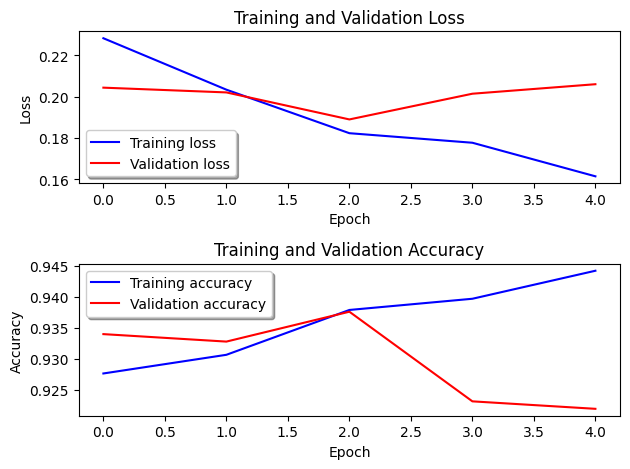

In [39]:
import matplotlib.pyplot as plt

# Assuming hist is your history object from model training

fig, ax = plt.subplots(2, 1)

# Plot training loss
ax[0].plot(hist.history['loss'], color='b', label="Training loss")

# Plot validation loss
ax[0].plot(hist.history['val_loss'], color='r', label="Validation loss")

# Add legend for the first subplot (training and validation loss)
legend = ax[0].legend(loc='best', shadow=True)

# Plot training accuracy
ax[1].plot(hist.history['accuracy'], color='b', label="Training accuracy")

# Plot validation accuracy
ax[1].plot(hist.history['val_accuracy'], color='r', label="Validation accuracy")

# Add legend for the second subplot (training and validation accuracy)
legend = ax[1].legend(loc='best', shadow=True)

# Set titles and labels for the subplots
ax[0].set_title("Training and Validation Loss")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("Loss")

ax[1].set_title("Training and Validation Accuracy")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("Accuracy")

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


In [40]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

27/27 [==============================] - 4s 132ms/step


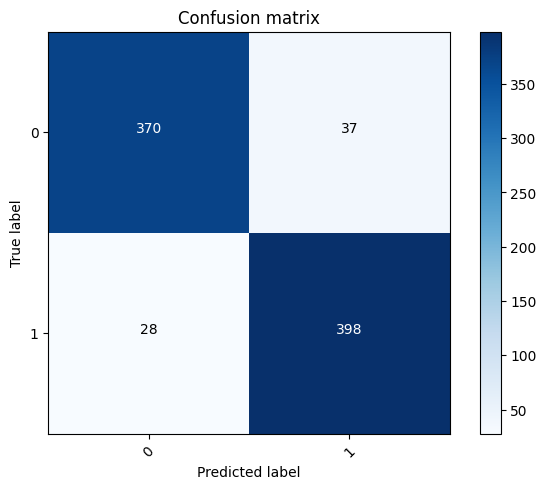

In [41]:
# Predict the values from the validation dataset
Y_pred = model.predict(X_val)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))

In [42]:
class_names = ['fake', 'real']

In [43]:
real_image_path = 'C:\\Users\\dswet\\Downloads\\CASIA2\\test\\Au\\Au_ani_00001.jpg'
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 30ms/step
Class: real Confidence: 100.00


In [44]:
fake_image_path = 'C:\\Users\\dswet\\Downloads\\CASIA2\\test\\Tp\\Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 29ms/step
Class: fake Confidence: 97.70


In [45]:
fake_image = os.listdir('C:\\Users\\dswet\\Downloads\\CASIA2\\test\\Tp')
correct = 0
total = 0
for file_name in fake_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join('C:\\Users\\dswet\\Downloads\\CASIA2\\test\\Tp', file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total += 1
        if y_pred_class == 0:
            correct += 1
#             print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 47ms/step


In [46]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 2064, Correct: 1913, Acc: 92.68410852713178


In [47]:
real_image = os.listdir('C:\\Users\\dswet\\Downloads\\CASIA2\\test\\Au')
correct_r = 0
total_r = 0
for file_name in real_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join('C:\\Users\\dswet\\Downloads\\CASIA2\\test\\Au', file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total_r += 1
        if y_pred_class == 1:
            correct_r += 1
#             print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 [==============================] - 0s 78ms/step


In [48]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 7437, Correct: 6911, Acc: 92.92725561382278
Total: 9501, Correct: 8824, Acc: 92.87443427007683


In [49]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot

In [50]:
import os
import numpy as np
from PIL import Image
from keras.preprocessing import image

# Directory containing image files
directory = 'C:\\Users\\dswet\\Downloads\\archive (6)\\casia\\CASIA2\\Tp'

images = []
for filename in os.listdir(directory):
    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Filter by image file extensions
        filepath = os.path.join(directory, filename)
        try:
            # Load and preprocess the image
            img = image.load_img(filepath, target_size=(128, 128))
            img_array = image.img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0)
            images.append(img_array)
        except Exception as e:
            print(f"Error loading image '{filename}': {e}")

# Concatenate all images into a single array
if images:
    images_array = np.concatenate(images, axis=0)
    print(f"Loaded {len(images)} images successfully.")
else:
    print("No valid images found in the directory.")

# Now 'images_array' contains all loaded and preprocessed images


Loaded 2064 images successfully.


In [51]:
import keras
from keras.models import load_model, Sequential
from keras.layers import Dense, Flatten
from keras.applications.resnet50 import ResNet50

In [52]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

# Load the pre-trained ResNet-50 model without the top classification layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Load the existing sequential model
existing_model = load_model('model_casia_run1.h5')

# Define input tensor for the existing model
input_tensor = existing_model.input

# Get output tensor from the base model
base_output = base_model(input_tensor)

# Add GlobalAveragePooling2D layer to reduce spatial dimensions
pooled_output = GlobalAveragePooling2D()(base_output)

# Add a Dense layer for binary classification (assuming 1 output neuron for binary classification)
predictions = Dense(1, activation='sigmoid')(pooled_output)

# Create the combined model using the functional API
final_model = Model(inputs=input_tensor, outputs=predictions)

# Compile the final model
final_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display summary of the final model
final_model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_input (InputLayer)   [(None, 128, 128, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 1)                 2049      
                                                                 
Total params: 23589761 (89.99 MB)
Trainable params: 2049 (8.00 KB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [53]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the pre-trained ResNet-50 model without the top classification layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Load the existing sequential model
existing_model = load_model('model_casia_run1.h5')

# Define input tensor for the existing model
input_tensor = existing_model.input

# Get output tensor from the base model
base_output = base_model(input_tensor)

# Add GlobalAveragePooling2D layer to reduce spatial dimensions
pooled_output = GlobalAveragePooling2D()(base_output)

# Add a Dense layer for binary classification (assuming 1 output neuron for binary classification)
predictions = Dense(1, activation='sigmoid')(pooled_output)

# Create the combined model using the functional API
final_model = Model(inputs=input_tensor, outputs=predictions)

# Compile the final model
final_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Specify the path to the validation dataset directory
validation_data_dir = 'C:\\Users\\dswet\\Downloads\\archive (6)\\casia'

# Create an ImageDataGenerator for validation data
validation_datagen = ImageDataGenerator(rescale=1./255)  # Rescale pixel values to [0,1]

# Load validation dataset from directory
validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary',  # Adjust based on dataset structure (e.g., 'binary' or 'categorical')
    shuffle=False  # Ensure consistent order for evaluation
)

# Check if any images are found in the validation dataset
if validation_generator.samples == 0:
    print(f"No images found in the directory: {validation_data_dir}")
else:
    # Evaluate the model on the validation dataset
    loss, accuracy = final_model.evaluate(validation_generator)

    # Print the validation accuracy
    print(f'Validation Accuracy: {accuracy * 100:.2f}%')


Found 14335 images belonging to 2 classes.
448/448 [==============================] - 6438s 14s/step - loss: 0.8593 - accuracy: 0.1200
Validation Accuracy: 12.00%


In [55]:
import matplotlib.pyplot as plt

# Define callbacks to record training history
class AccuracyHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.acc = []
        self.val_acc = []

    def on_epoch_end(self, epoch, logs={}):
        self.acc.append(logs.get('accuracy'))
        self.val_acc.append(logs.get('val_accuracy'))

# Create an instance of AccuracyHistory
history = AccuracyHistory()

# Train the final_model
epochs = 10  # Choose the number of epochs
final_model.fit(
    validation_generator,
    epochs=epochs,
    callbacks=[history]  # Pass the AccuracyHistory callback for recording
)

# Plot the accuracy over epochs
plt.plot(range(1, epochs + 1), history.acc, label='Training Accuracy')
plt.plot(range(1, epochs + 1), history.val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


Epoch 1/10
448/448 [==============================] - 6961s 16s/step - loss: 0.3886 - accuracy: 0.8797
Epoch 2/10
 89/448 [====>.........................] - ETA: 1:13:44 - loss: 0.4680 - accuracy: 0.8423

KeyboardInterrupt: 